In [1]:
!date

Thu Oct 22 17:24:44 PDT 2020


# Merfish

In [2]:
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as mpatches
import scanpy as scanp
from scipy.stats import ks_2samp, ttest_ind
from scipy.sparse import csr_matrix
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import NeighborhoodComponentsAnalysis
from matplotlib import cm
from scipy.spatial import ConvexHull
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import normalize

import warnings
warnings.filterwarnings('ignore')

fsize=20

plt.rcParams.update({'font.size': fsize})
%config InlineBackend.figure_format = 'retina'

In [3]:
clusters = pd.read_csv("../../reference/merfish/cell_labels.csv")
clusters.index = clusters["Unnamed: 0"].values
del clusters["Unnamed: 0"]

In [4]:
adata = anndata.read_h5ad("../../data/merfish/merfish_M1.h5ad")
tmp = pd.DataFrame({col: adata.obs.index.map(clusters[col]) for col in clusters})
adata.obs = tmp

In [5]:
adata.layers["X"] = csr_matrix(adata.X)
adata.layers["norm"] = normalize(adata.X, norm='l1', axis=1)*1000000
adata.layers["log1p"] = csr_matrix(np.log1p(adata.layers["norm"]))

In [6]:
from sklearn.preprocessing import scale

In [7]:
%%time
mat = adata.layers["log1p"].todense()
mtx = scale(mat, axis=0, with_mean=True, with_std=True, copy=True)
adata.X = mtx

CPU times: user 2.51 s, sys: 1.72 s, total: 4.23 s
Wall time: 4.23 s


In [8]:
adata

AnnData object with n_obs × n_vars = 243799 × 254
    obs: 'label', 'subclass', 'sampleID', 'sliceID', 'label_v1', 'AP_distance (um)', 'pos_x (um)', 'pos_y (um)'
    layers: 'X', 'norm', 'log1p'

In [9]:
adata.obs.head()

,label,subclass,sampleID,sliceID,label_v1,AP_distance (um),pos_x (um),pos_y (um)
0,Sst_1,Sst,dataset2_sample6,dataset2_slice109,I30,1180,-79.474594,2211.467867
1,Endo,Endothelial,dataset1_sample1,dataset1_slice50,Endo,490,3837.284502,-3847.753461
2,L6_IT_1,L6_IT,dataset2_sample3,dataset2_slice139,E8,1480,3502.243851,-3511.940334
3,L2/3_IT_3,L2/3_IT,dataset2_sample1,dataset2_slice61,E2,700,-3975.718063,-2609.660891
4,VLMC,VLMC,dataset1_sample5,dataset1_slice260,VLMC,2590,-6370.114257,623.408623


In [10]:
adata.obs.subclass.value_counts()

L2/3_IT             33757
L4/5_IT             29147
L6_CT               23878
Oligodendrocytes    19472
Astrocytes          19230
Endothelial         18183
L5_IT               14685
L6_IT               12475
Microglia            8554
Pvalb                7885
L5_PT                6759
Pericytes            6553
VLMC                 6173
Macrophages          5133
OPC                  4906
Sst                  4853
SMC                  3785
L6b                  3487
L56_NP               3482
striatum             3214
Lamp5                3095
Vip                  2789
L6_IT_Car3           1563
Sncg                  477
Sst_Chodl             232
Ependymal              32
Name: subclass, dtype: int64

In [11]:
gb = adata.obs.groupby("sliceID")["pos_x (um)", "pos_y (um)"]

In [12]:
adata.shape

(243799, 254)

In [13]:
cols = ["transcript_id", "gene_id", "gene_name", "transcript_name", "chromosome", "start", "stop", "strand"]
t2g = pd.read_csv("../../reference/t2g.txt", sep="\t", header=None, names=cols)

In [14]:
c = t2g.groupby("gene_name")["transcript_id"].nunique()

In [15]:
adata.var["n_iso"] = adata.var.index.map(c)

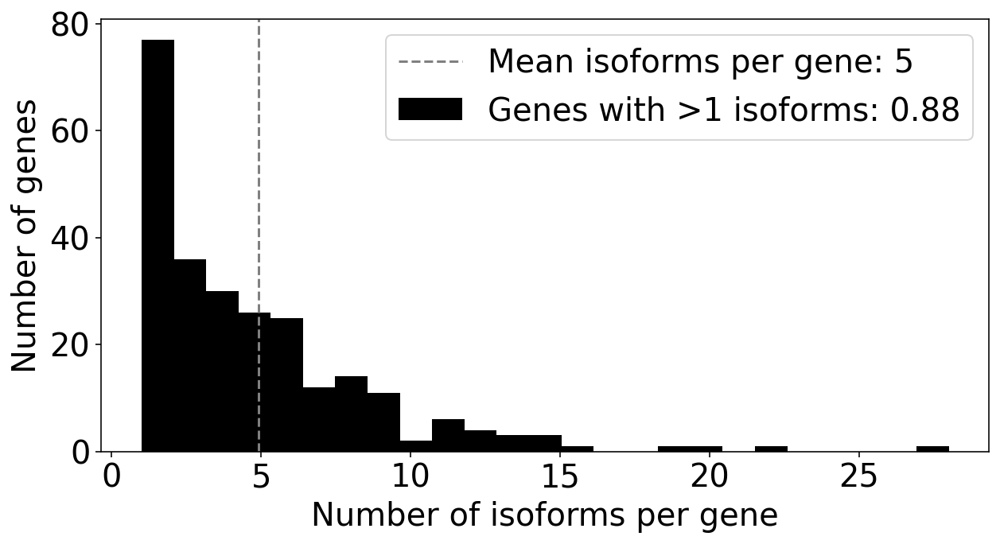

In [16]:
fig, ax = plt.subplots(figsize=(10,5))
x = adata.var["n_iso"].values
ax.hist(x, bins=25, color="k", label="Genes with >1 isoforms: {:,.2f}".format((x>1).sum()/x.shape[0]))

ax.set_xlabel("Number of isoforms per gene")
ax.set_ylabel("Number of genes")

ax.axvline(x.mean(), color="grey", linestyle="--", label="Mean isoforms per gene: {:,.0f}".format(x.mean()))

ax.legend()
plt.savefig("../../figures/merfish_isoform_distribution.png", bbox_inches='tight', dpi=300)

plt.show()

In [17]:
gene = "Pvalb"

In [18]:
gene in adata.var.index.values

True

In [19]:
def trim_axs(axs, N):
    """little helper to massage the axs list to have correct length..."""
    axs = axs.flat
    for ax in axs[N:]:
        ax.remove()
    return axs[:N]

In [20]:
sliceID = adata.obs.sliceID.values
sliceID = np.unique(sliceID)

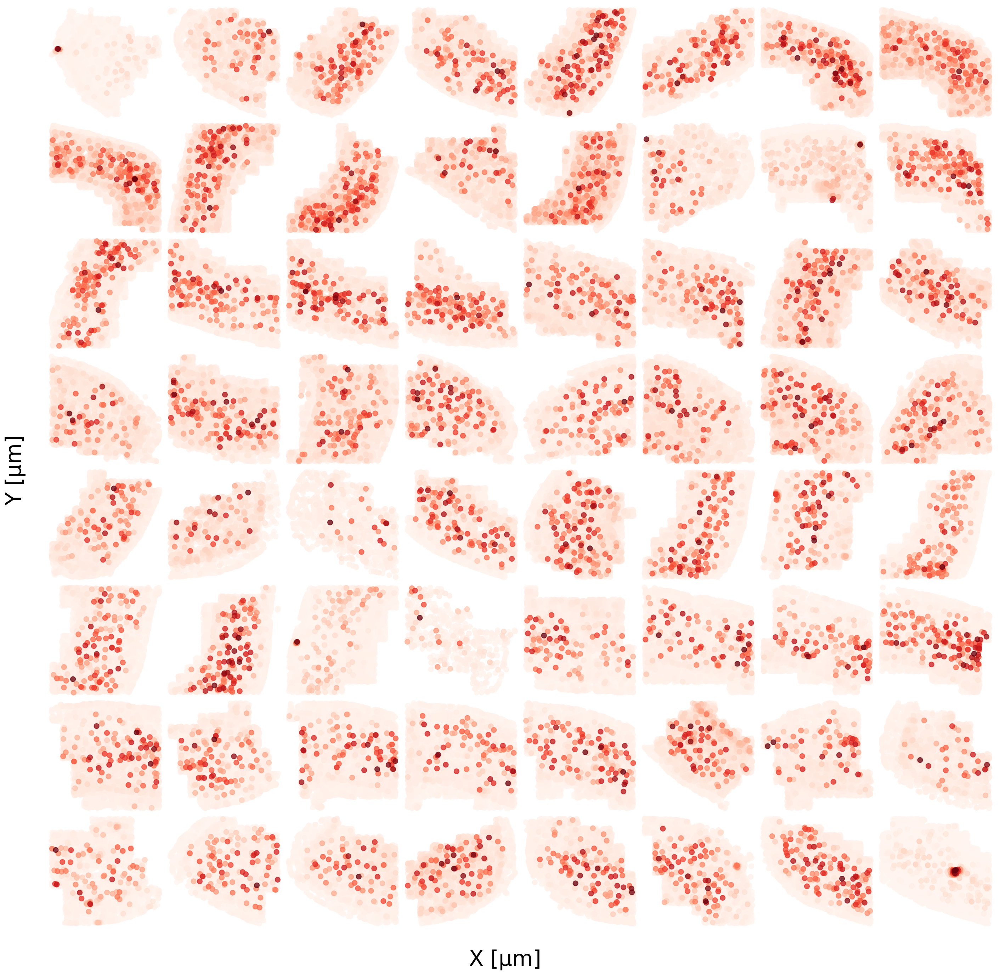

CPU times: user 35.5 s, sys: 1.1 s, total: 36.6 s
Wall time: 35.8 s


In [28]:
%%time
fig, ax = plt.subplots(figsize=(24,24), ncols=8, nrows=8)
fig.subplots_adjust(hspace=0, wspace=0)
axs = trim_axs(ax, len(sliceID))

gene_vec = adata.layers["X"].todense()[:,adata.var.index == gene]


for sidx, (ax, slice_name) in enumerate(zip(axs, sliceID)):

    s = gb.get_group(sliceID[sidx])
    
    X_mask = s.index.values
    
    x = adata.obs["pos_x (um)"][X_mask]
    y = adata.obs["pos_y (um)"][X_mask]
    
    # points = np.array([x.tolist(), y.tolist()]).T
    # hull = ConvexHull(points)
    
    c = np.asarray(gene_vec[X_mask]).reshape(-1)
    argsort = np.argsort(c)
    x = x.values[argsort]
    y = y.values[argsort]
    c = c[argsort]
    
    ax.scatter(x, y, c=c, cmap="Reds", label=slice_name, s=50, alpha=0.75)
    
    # x = points[hull.vertices,0].tolist() + [points[hull.vertices,0].tolist()[0]]
    # y = points[hull.vertices,1].tolist() + [points[hull.vertices,1].tolist()[0]]
    # ax.plot(x, y, color="grey")
    ax.set_xlabel("X [µm]")
    ax.set_ylabel("y [µm]")
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    ax.set_axis_off()

fig.text(0.5, 0.1, 'X [µm]', ha='center', va='center', fontsize=30)
fig.text(0.1, 0.5, 'Y [µm]', ha='center', va='center', rotation='vertical', fontsize=30)
plt.savefig("../../figures/merfish_{}.png".format(gene), bbox_inches='tight',dpi=300)
plt.show()

In [29]:
specific_cluster = "Pvalb"

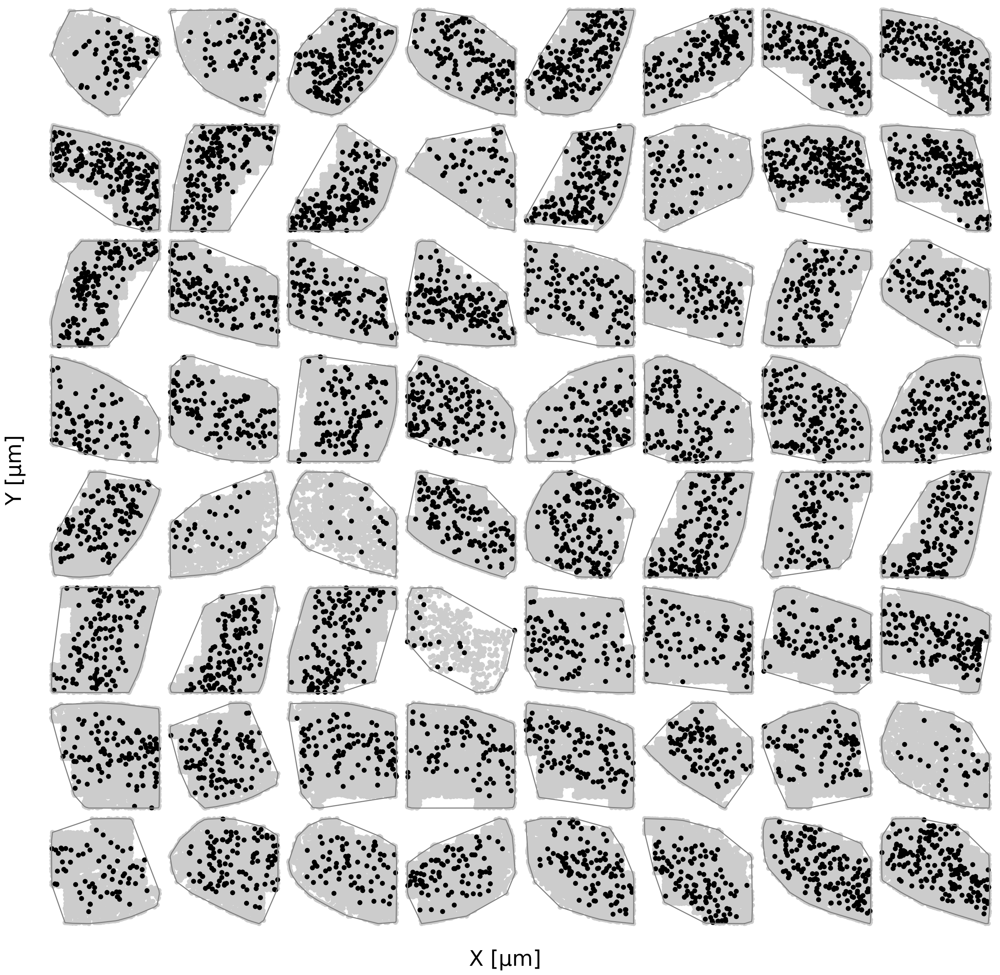

CPU times: user 28.8 s, sys: 245 ms, total: 29 s
Wall time: 28.9 s


In [45]:
%%time
fig, ax = plt.subplots(figsize=(24,24), ncols=8, nrows=8)
fig.subplots_adjust(hspace=0, wspace=0)

axs = trim_axs(ax, len(sliceID))

#gene_vec = adata.X[:,adata.var.index == gene]
le = LabelEncoder()
subclass_vec = le.fit_transform(adata.obs.subclass.values==specific_cluster)

for sidx, (ax, slice_name) in enumerate(zip(axs, sliceID)):
    s = gb.get_group(sliceID[sidx])
    
    X_mask = s.index.values
    
    x = adata.obs["pos_x (um)"][X_mask]
    y = adata.obs["pos_y (um)"][X_mask]
    c = np.asarray(subclass_vec[X_mask]).reshape(-1)
    
    argsort = np.argsort(c)
    x = x.values[argsort]
    y = y.values[argsort]
    c = c[argsort]
    

    
    points = np.array([x, y]).T
    hull = ConvexHull(points)
    
    ax.scatter(x, y, c=c, cmap="nipy_spectral_r", label=slice_name)

    x = points[hull.vertices,0].tolist() + [points[hull.vertices,0].tolist()[0]]
    y = points[hull.vertices,1].tolist() + [points[hull.vertices,1].tolist()[0]]
    ax.plot(x, y, color="grey")
    
    
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    ax.set_axis_off()
    
fig.text(0.5, 0.1, 'X [µm]', ha='center', va='center', fontsize=30)
fig.text(0.1, 0.5, 'Y [µm]', ha='center', va='center', rotation='vertical', fontsize=30)
plt.savefig("../../figures/merfish_cluster_loc_{}.png".format(gene), bbox_inches='tight',dpi=300)
plt.show()

In [46]:
unique = adata.obs.subclass.unique()

In [47]:
unique

array(['Sst', 'Endothelial', 'L6_IT', 'L2/3_IT', 'VLMC', 'L6_CT',
       'L4/5_IT', 'Vip', 'Pvalb', 'Oligodendrocytes', 'Microglia',
       'L5_PT', 'L5_IT', 'Pericytes', 'Astrocytes', 'L56_NP',
       'L6_IT_Car3', 'OPC', 'Lamp5', 'SMC', 'Sncg', 'striatum', 'L6b',
       'Macrophages', 'Sst_Chodl', 'Ependymal'], dtype=object)

In [48]:
specific_gene = "Pvalb"
specific_cluster = "Pvalb"

In [49]:
adata.obs.subclass.unique()

array(['Sst', 'Endothelial', 'L6_IT', 'L2/3_IT', 'VLMC', 'L6_CT',
       'L4/5_IT', 'Vip', 'Pvalb', 'Oligodendrocytes', 'Microglia',
       'L5_PT', 'L5_IT', 'Pericytes', 'Astrocytes', 'L56_NP',
       'L6_IT_Car3', 'OPC', 'Lamp5', 'SMC', 'Sncg', 'striatum', 'L6b',
       'Macrophages', 'Sst_Chodl', 'Ependymal'], dtype=object)

In [50]:
unique_map = {
"L5_IT" : "L5 IT",
"L6_CT" : "L6 CT",
"L6b" : "L6b",
"Vip" : "Vip",
"Pvalb" : "Pvalb",
"L2/3_IT" : "L2/3 IT",
"L6_IT" : "L6 IT",
"Sst" : "Sst",
"Lamp5" : "Lamp5",
"L56_NP" : "L5/6 NP",
"Sncg" : "Sncg",
"SMC" : "SMC",
"L5_PT" : "L5 PT", # Check
"Endothelial" : "Endo",
"Astrocytes" : "Astro",
"VLMC" : "VLMC",
"L6_IT_Car3" : "L6 IT Car3"}

inv_map = {v: k for k, v in unique_map.items()}

In [51]:
specific_gene

'Pvalb'

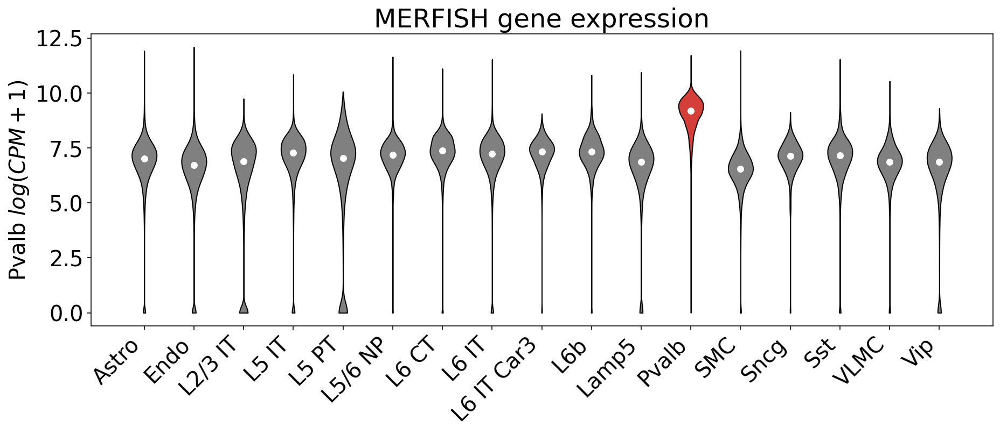

In [52]:
fig, ax = plt.subplots(figsize=(15,5), nrows=1)



unique = np.unique(adata.obs.subclass)
labels = [unique_map.get(i) for i in unique_map.keys()]
labels = np.sort(labels).tolist()
lidx = np.arange(1, len(labels)+1)  # the label locations

tmp_specific_cluster = unique_map[specific_cluster]

midx = labels.index(tmp_specific_cluster)


tmp = adata[:,adata.var.index.values==specific_gene]

x = []
for c in labels:
    tmp_cluster = inv_map[c]
    x.append(np.asarray(tmp[adata.obs.subclass==tmp_cluster].layers["log1p"].todense()).reshape(-1).tolist())

parts = ax.violinplot(x, showmedians=False, showextrema=False)
for pcidx, pc in enumerate(parts['bodies']):
    pc.set_facecolor('grey')
    pc.set_edgecolor('black')
    pc.set_alpha(1)
    if pcidx == midx:
        pc.set_facecolor('#D43F3A')

medians = [np.median(i) for i in x]
ax.scatter(lidx, medians, marker='o', color='white', s=30, zorder=3)
ax.set_xticks(lidx)
ax.set_xticklabels(labels, rotation=45, ha="right")
#ax.axhline(y=medians[midx], color="k")
ax.set_ylabel("{} $log(CPM + 1)$".format(specific_gene))
ax.set_title("MERFISH gene expression")
plt.savefig("../../figures/merfish_violin_{}.png".format(specific_gene), bbox_inches='tight',dpi=300)
plt.show()

In [53]:
adata.obs["cell_id"] = adata.obs.index.values

# Save adata

In [54]:
adata.write("../../data/notebook/revision/merfish.h5ad")

... storing 'label' as categorical
... storing 'subclass' as categorical
... storing 'sampleID' as categorical
... storing 'sliceID' as categorical
... storing 'label_v1' as categorical


# Cluster comparisons

In [188]:
ss = anndata.read_h5ad("../../data/notebook/revision/no_filter_gene.h5ad")

In [189]:
print(ss)
print(adata)

AnnData object with n_obs × n_vars = 6295 × 31053
    obs: 'cluster_id', 'cluster_label', 'subclass_label', 'class_label', 'cluster_color', 'size', 'cell_id', 'subclass_id', 'class_id', 'cell_counts', 'percent_mito', 'n_genes', 'pass_count_filter'
    var: 'transcript_id', 'gene_id', 'gene_name', 'transcript_name', 'length', 'txn_list', 'num_isoforms', 'gene_counts', 'dispersion', 'pass_disp_filter', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg'
    layers: 'X', 'log1p', 'norm'
AnnData object with n_obs × n_vars = 243799 × 254
    obs: 'label', 'subclass', 'sampleID', 'sliceID', 'label_v1', 'AP_distance (um)', 'pos_x (um)', 'pos_y (um)', 'cell_id'
    var: 'n_iso'
    layers: 'X', 'norm', 'log1p'


In [190]:
ss_genes = ss.var.gene_name.str.split("_").apply(lambda x: x[0]).values
adata_genes = adata.var.index.values

In [191]:
common_genes = np.intersect1d(ss_genes, adata_genes)

In [192]:
ss.var["gene_name_only"] = ss.var.gene_name.str.split("_").apply(lambda x: x[0]).values

In [193]:
mfish = adata[:,adata.var.index.isin(common_genes)]
ss = ss[:,ss.var.gene_name_only.isin(common_genes)]

In [194]:
mfish.obs

,label,subclass,sampleID,sliceID,label_v1,AP_distance (um),pos_x (um),pos_y (um),cell_id
0,Sst_1,Sst,dataset2_sample6,dataset2_slice109,I30,1180,-79.474594,2211.467867,0
1,Endo,Endothelial,dataset1_sample1,dataset1_slice50,Endo,490,3837.284502,-3847.753461,1
2,L6_IT_1,L6_IT,dataset2_sample3,dataset2_slice139,E8,1480,3502.243851,-3511.940334,2
3,L2/3_IT_3,L2/3_IT,dataset2_sample1,dataset2_slice61,E2,700,-3975.718063,-2609.660891,3
4,VLMC,VLMC,dataset1_sample5,dataset1_slice260,VLMC,2590,-6370.114257,623.408623,4
...,...,...,...,...,...,...,...,...,...
243794,L5_IT_3,L5_IT,dataset2_sample3,dataset2_slice319,E13,3280,-6732.826681,1631.711188,243794
243795,L2/3_IT_1,L2/3_IT,dataset1_sample4,dataset1_slice162,E5,1610,-6738.905580,-1201.478276,243795
243796,L6_CT_2,L6_CT,dataset2_sample6,dataset2_slice289,E23,2980,-612.707832,-1602.161256,243796
243797,Endo,Endothelial,dataset1_sample4,dataset1_slice170,Endo,1690,-93.964710,-5245.891323,243797


In [195]:
ss.obs["subclass_label"] = ss.obs["subclass_label"].astype(str)

Trying to set attribute `.obs` of view, copying.


In [196]:
ss.obs.subclass_label.value_counts()

L5 IT          1571
L6 CT           904
Vip             659
L6b             571
Pvalb           543
L2/3 IT         483
Sst             427
L6 IT           395
Lamp5           377
L5/6 NP         208
Sncg             84
SMC              21
Low Quality      12
L5 PT            12
Astro            10
Endo              7
VLMC              6
L6 IT Car3        5
Name: subclass_label, dtype: int64

In [198]:
mfish.obs.subclass.value_counts()

L2/3_IT             33757
L4/5_IT             29147
L6_CT               23878
Oligodendrocytes    19472
Astrocytes          19230
Endothelial         18183
L5_IT               14685
L6_IT               12475
Microglia            8554
Pvalb                7885
L5_PT                6759
Pericytes            6553
VLMC                 6173
Macrophages          5133
OPC                  4906
Sst                  4853
SMC                  3785
L6b                  3487
L56_NP               3482
striatum             3214
Lamp5                3095
Vip                  2789
L6_IT_Car3           1563
Sncg                  477
Sst_Chodl             232
Ependymal              32
Name: subclass, dtype: int64

# Process

In [199]:
from sklearn.preprocessing import normalize

In [200]:
ss.layers["norm"] = normalize(ss.layers["X"], norm='l1', axis=1)*1000000
ss.layers["log1p"] = csr_matrix(np.log1p(ss.layers["norm"]))

In [201]:
from sklearn.preprocessing import scale

In [202]:
%%time
mat = ss.layers["log1p"].todense()
mtx = scale(mat, axis=0, with_mean=True, with_std=True, copy=True)
ss.X = mtx

CPU times: user 46.5 ms, sys: 3.8 ms, total: 50.3 ms
Wall time: 49.3 ms


In [203]:
print(ss)
print(mfish)

AnnData object with n_obs × n_vars = 6295 × 254
    obs: 'cluster_id', 'cluster_label', 'subclass_label', 'class_label', 'cluster_color', 'size', 'cell_id', 'subclass_id', 'class_id', 'cell_counts', 'percent_mito', 'n_genes', 'pass_count_filter'
    var: 'transcript_id', 'gene_id', 'gene_name', 'transcript_name', 'length', 'txn_list', 'num_isoforms', 'gene_counts', 'dispersion', 'pass_disp_filter', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_name_only'
    uns: 'hvg'
    layers: 'X', 'log1p', 'norm'
View of AnnData object with n_obs × n_vars = 243799 × 254
    obs: 'label', 'subclass', 'sampleID', 'sliceID', 'label_v1', 'AP_distance (um)', 'pos_x (um)', 'pos_y (um)', 'cell_id'
    var: 'n_iso'
    layers: 'X', 'norm', 'log1p'


In [204]:
mfish.var

,n_iso
index,
1700022I11Rik,5
1810046K07Rik,2
5031425F14Rik,1
5730522E02Rik,8
Acta2,1
...,...
Sst,1
Rab3b,4
Slc17a7,5


In [205]:
ss = ss[:,ss.var.sort_values("gene_name_only").index]
mfish = mfish[:,mfish.var.sort_index().index]

In [206]:
ss.var.head()

,transcript_id,gene_id,gene_name,transcript_name,length,txn_list,num_isoforms,gene_counts,dispersion,pass_disp_filter,highly_variable,means,dispersions,dispersions_norm,gene_name_only
1700022I11Rik_ENSMUSG00000028451,ENSMUST00000189414,ENSMUSG00000028451,1700022I11Rik_ENSMUSG00000028451,1700022I11Rik-204_ENSMUST00000189414,518,"['ENSMUST00000189414', 'ENSMUST00000185904', '...",5,0.988477,0.023196,True,False,0.108015,2.785275,0.326415,1700022I11Rik
1810046K07Rik_ENSMUSG00000036027,ENSMUST00000039959,ENSMUSG00000036027,1810046K07Rik_ENSMUSG00000036027,1810046K07Rik-201_ENSMUST00000039959,1318,"['ENSMUST00000039959', 'ENSMUST00000181366']",2,0.179212,0.030656,True,False,0.019548,2.969544,0.410919,1810046K07Rik
5031425F14Rik_ENSMUSG00000085129,ENSMUST00000127920,ENSMUSG00000085129,5031425F14Rik_ENSMUSG00000085129,5031425F14Rik-201_ENSMUST00000127920,2098,['ENSMUST00000127920'],1,6.078172,0.094898,True,True,0.490065,4.021044,0.893130,5031425F14Rik
5730522E02Rik_ENSMUSG00000032985,ENSMUST00000153834,ENSMUSG00000032985,5730522E02Rik_ENSMUSG00000032985,5730522E02Rik-207_ENSMUST00000153834,473,"['ENSMUST00000153834', 'ENSMUST00000144503', '...",8,126.264420,0.103674,True,True,2.784232,4.220397,1.015788,5730522E02Rik
Acta2_ENSMUSG00000035783,ENSMUST00000039631,ENSMUSG00000035783,Acta2_ENSMUSG00000035783,Acta2-201_ENSMUST00000039631,1781,['ENSMUST00000039631'],1,129.483337,13.230916,True,True,3.230993,9.535823,9.322950,Acta2


In [207]:
mfish.var.head()

,n_iso
index,
1700022I11Rik,5
1810046K07Rik,2
5031425F14Rik,1
5730522E02Rik,8
Acta2,1


In [208]:
def split_by_target(mat, targets, target, axis=0):
    """
    Split the rows of mat by the proper assignment
    
    mat = ndarray
    targets, length is equal to number of components (axis=0) or features (axis=1)
    target is a singular element from unique(assignments/features) 
    """
    if axis==0 and len(targets) != mat.shape[axis]: return -1
    if axis==1 and len(targets) != mat.shape[axis]: return -1
        
    mask = targets == target
    
    if axis==0:
        t_mat = mat[mask]  # target matrix
        c_mat = mat[~mask] # complement matrix
    elif axis==1:
        t_mat = mat[:, mask]  # target matrix
        c_mat = mat[:, ~mask] # complement matrix
    
    return (t_mat, c_mat)

def group_mtx_by_cluster(mtx, components, features, s2t, source_id="cell_id", target_id="subclass_label", by="components"):
    """
    mtx: ndarray components by features 
    components: labels for rows of mtx
    features: labels for columns of mtx
    s2t: pandas dataframe mapping source (features or components) to a
    targets features(components) to group by
    target_id: column name in s2t to group by
    """
    if target_id not in s2t.columns: return -1
    
    ncomp   = components.shape[0]
    nfeat   = features.shape[0]
    ntarget = s2t[target_id].nunique()
    
    if by =="features": 
        source = features
    elif by =="components": 
        source = components
    
    # Map the source to an index
    source2idx = dict(zip(source, range(len(source))))
    # Map the target to a list of source indices
    target2idx = (s2t.groupby(target_id)[source_id].apply(lambda x: [source2idx[i] for i in x])).to_dict()
    
    # array of unique targets
    unique = s2t[target_id].unique().astype(str)
    nuniq = unique.shape[0]
    X = np.zeros((nuniq, mtx.shape[1]))
    
    for tidx, t in enumerate(unique):
        # Grab the matrix indices corresponding to columns and source columns to group by
        source_indices = target2idx[t]
        #print(source_indices)
        
        # breaks generality
        sub_mtx = mtx[source_indices,:].mean(axis=0) # Sum on source indicies
        X[tidx,:] = sub_mtx # place summed vector in new matrix
        
    # Return matrix that is grouped by
    return (X, components, unique)

In [211]:
mfish.obs.subclass.astype(str)

0                 Sst
1         Endothelial
2               L6_IT
3             L2/3_IT
4                VLMC
             ...     
243794          L5_IT
243795        L2/3_IT
243796          L6_CT
243797    Endothelial
243798          L6_IT
Name: subclass, Length: 243799, dtype: object

In [212]:
unique_map = {
"L5_IT" : "L5 IT",
"L6_CT" : "L6 CT",
"L6b" : "L6b",
"Vip" : "Vip",
"Pvalb" : "Pvalb",
"L2/3_IT" : "L2/3 IT",
"L6_IT" : "L6 IT",
"Sst" : "Sst",
"Lamp5" : "Lamp5",
"L56_NP" : "L5/6 NP",
"Sncg" : "Sncg",
"SMC" : "SMC",
"L5_PT" : "L5 PT", # Check
"Endothelial" : "Endo",
"Astrocytes" : "Astro",
"VLMC" : "VLMC",
"L6_IT_Car3" : "L6 IT Car3"}

inv_map = {v: k for k, v in unique_map.items()}

In [213]:
ss = ss[ss.obs.subclass_label!="Low Quality"]

In [225]:
mfish.obs["ss_subclass"] = mfish.obs["subclass"].astype(str).apply(lambda x: unique_map.get(x, "None"))

mfish = mfish[mfish.obs.ss_subclass != "None"]

In [226]:
mfish_mat = mfish.X
mfish_ass = mfish.obs.ss_subclass.values

In [227]:
ss_mat = ss.X
ss_ass = ss.obs.subclass_label.values

In [228]:
ss

View of AnnData object with n_obs × n_vars = 6283 × 254
    obs: 'cluster_id', 'cluster_label', 'subclass_label', 'class_label', 'cluster_color', 'size', 'cell_id', 'subclass_id', 'class_id', 'cell_counts', 'percent_mito', 'n_genes', 'pass_count_filter'
    var: 'transcript_id', 'gene_id', 'gene_name', 'transcript_name', 'length', 'txn_list', 'num_isoforms', 'gene_counts', 'dispersion', 'pass_disp_filter', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_name_only'
    uns: 'hvg'
    layers: 'X', 'log1p', 'norm'

In [229]:
mfish

View of AnnData object with n_obs × n_vars = 166556 × 254
    obs: 'label', 'subclass', 'sampleID', 'sliceID', 'label_v1', 'AP_distance (um)', 'pos_x (um)', 'pos_y (um)', 'cell_id', 'ss_subclass'
    var: 'n_iso'
    layers: 'X', 'norm', 'log1p'

In [230]:
features = mfish.var.index.values

unique = np.intersect1d(np.unique(mfish_ass.astype(str)), np.unique(ss_ass.astype(str)))

In [231]:
unique

array(['Astro', 'Endo', 'L2/3 IT', 'L5 IT', 'L5 PT', 'L5/6 NP', 'L6 CT',
       'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Pvalb', 'SMC', 'Sncg',
       'Sst', 'VLMC', 'Vip'], dtype='<U10')

In [232]:
def nd(arr):
    return np.asarray(arr).reshape(-1)

In [233]:
from scipy import stats

In [234]:
%%time
r2 = []
ss_x = []
mfish_x = []

for uidx, u in enumerate(unique):
    mfish_t_mat, _ = split_by_target(mfish_mat, mfish_ass, u)
    ss_t_mat, _ = split_by_target(ss_mat, ss_ass, u)
    
    
    mf = np.asarray(mfish_t_mat.mean(axis=0)).reshape(-1)
    s = np.asarray(ss_t_mat.mean(axis=0)).reshape(-1)
    
    ss_x.append(s)
    mfish_x.append(mf)
    
    r, p = stats.pearsonr(mf, s)
    r2.append(r)
    print("[{} of {}] {:,.2f}: {}".format(uidx+1, unique.shape[0],r, u) )

[1 of 17] 0.55: Astro
[2 of 17] 0.65: Endo
[3 of 17] 0.78: L2/3 IT
[4 of 17] 0.45: L5 IT
[5 of 17] 0.77: L5 PT
[6 of 17] 0.85: L5/6 NP
[7 of 17] 0.81: L6 CT
[8 of 17] 0.80: L6 IT
[9 of 17] 0.74: L6 IT Car3
[10 of 17] 0.88: L6b
[11 of 17] 0.88: Lamp5
[12 of 17] 0.86: Pvalb
[13 of 17] 0.64: SMC
[14 of 17] 0.83: Sncg
[15 of 17] 0.82: Sst
[16 of 17] 0.69: VLMC
[17 of 17] 0.80: Vip
CPU times: user 629 ms, sys: 641 ms, total: 1.27 s
Wall time: 1.37 s


In [235]:
cluster_cmap = {
"Astro": (0.38823529411764707, 0.4745098039215686,  0.2235294117647059 ),  # 637939,
"Endo" : (0.5490196078431373,  0.6352941176470588,  0.3215686274509804 ),  # 8ca252,
"SMC"  : (0.7098039215686275,  0.8117647058823529,  0.4196078431372549 ),  # b5cf6b,
"VLMC" : (0.807843137254902,   0.8588235294117647,  0.611764705882353  ),  # cedb9c,
"Low Quality" : (0,0,0),
"L2/3 IT" : (0.9921568627450981,  0.6823529411764706,  0.4196078431372549  ),  # fdae6b
"L5 PT" : (0.9921568627450981,  0.8156862745098039,  0.6352941176470588  ),  # fdd0a2
"L5 IT" : (0.5176470588235295,  0.23529411764705882, 0.2235294117647059 ),  # 843c39
"L5/6 NP": "#D43F3A",
"L6 CT" : (0.8392156862745098,  0.3803921568627451,  0.4196078431372549 ),  # d6616b
"L6 IT" : (0.9058823529411765,  0.5882352941176471,  0.611764705882353  ),  # e7969c
"L6b" : (1.0,                 0.4980392156862745,  0.054901960784313725),  # ff7f0e
"L6 IT Car3" : (1.0,                 0.7333333333333333,  0.47058823529411764 ),  # ffbb78
"Lamp5" : (0.19215686274509805, 0.5098039215686274,  0.7411764705882353  ),  # 3182bd # blues
"Sncg" : (0.4196078431372549,  0.6823529411764706,  0.8392156862745098  ),  # 6baed6
"Vip" : (0.6196078431372549,  0.792156862745098,   0.8823529411764706  ),  # 9ecae1
"Sst" : (0.7764705882352941,  0.8588235294117647,  0.9372549019607843  ),  # c6dbef
"Pvalb":(0.7372549019607844,  0.7411764705882353,  0.8627450980392157  ),  # bcbddc
}

In [236]:
ss_size = ss.obs["subclass_label"].value_counts()[unique]

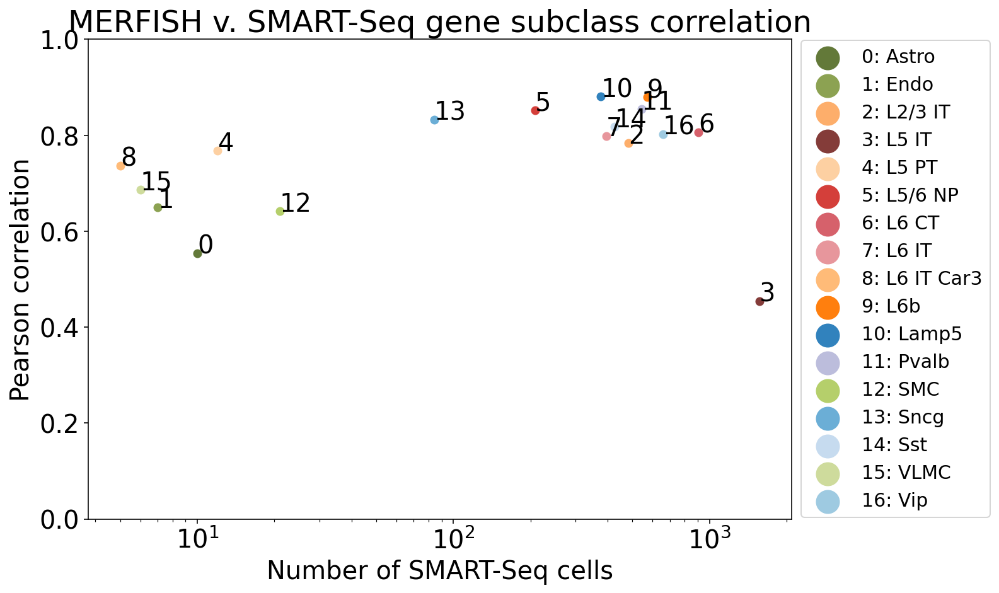

In [237]:
fig, ax = plt.subplots(figsize=(10,7))

x = ss_size
y = r2

for i, txt in enumerate(unique):
    ax.annotate(i, (x[i], y[i]))
    ax.scatter(x[i], y[i], label="{}: {}".format(i, txt), color=cluster_cmap[txt])
ax.set_ylim((0, 1))
ax.set_xscale("log")
    
ax.set_xlabel("Number of SMART-Seq cells")
ax.set_ylabel("Pearson correlation")
ax.legend(fontsize=15,loc='center left', bbox_to_anchor=(1, 0.5), markerscale=3)
ax.set_title("MERFISH v. SMART-Seq gene subclass correlation")

plt.savefig("../../figures/merfish_correlation_size.png", bbox_inches='tight', dpi=300)
plt.show()

In [238]:
def trim_axs(axs, N):
    """little helper to massage the axs list to have correct length..."""
    axs = axs.flat
    for ax in axs[N:]:
        ax.remove()
    return axs[:N]

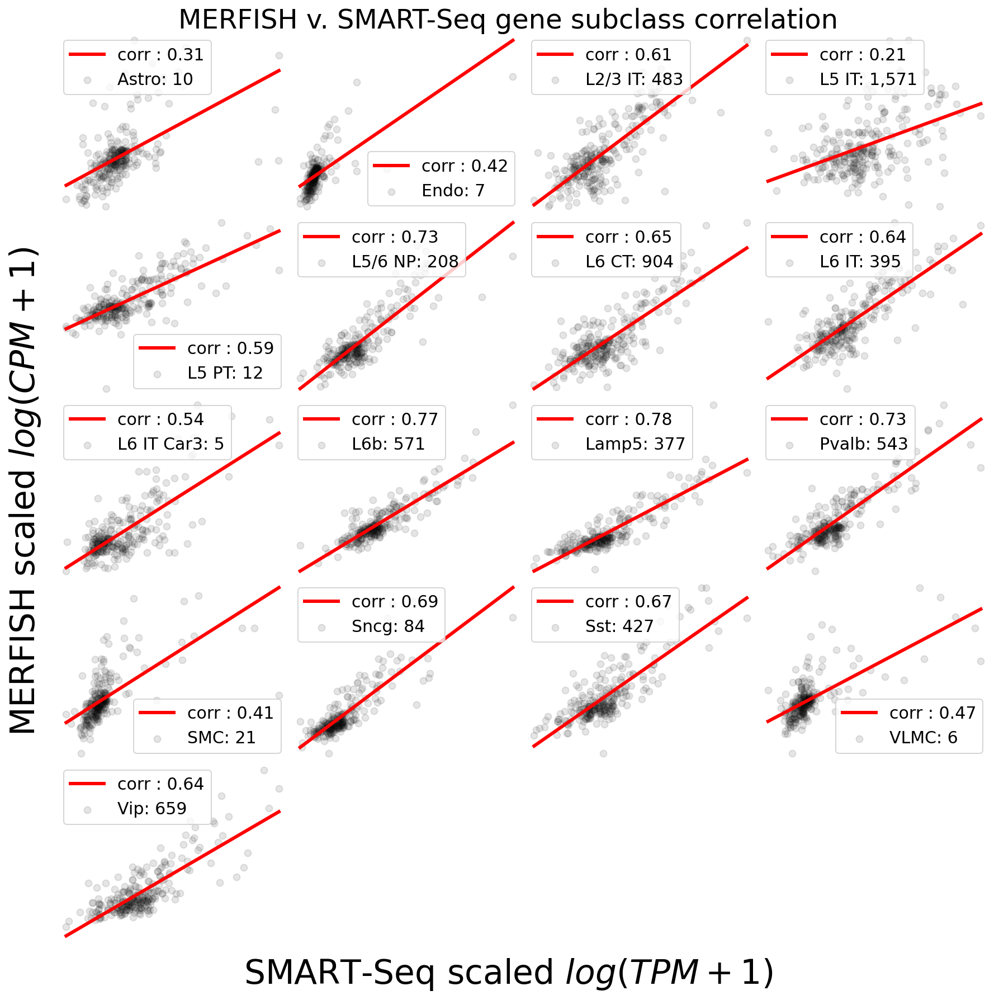

In [239]:
fig, ax = plt.subplots(figsize=(15,15), ncols=4, nrows=5)
fig.subplots_adjust(hspace=0, wspace=0)
axs = trim_axs(ax, len(unique))
fig.suptitle('MERFISH v. SMART-Seq gene subclass correlation', y=0.9)


for cidx, (ax, c) in enumerate(zip(axs, unique)):
    
    
    x = ss_x[cidx]
    y = mfish_x[cidx]

    
    ax.scatter(x, y, label="{}: {:,}".format(c, ss_size[cidx]), color="k", alpha=0.1)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)

    minx = min(x)
    maxx = max(x)
    x = np.linspace(minx, maxx, 10)
    y = slope*x+intercept
    ax.plot(x, y, label="corr : {:,.2f}".format(r_value**2), color="red", linewidth=3)
    ax.legend(fontsize=15)
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    ax.set_axis_off()
fig.text(0.5, 0.1, 'SMART-Seq scaled $log(TPM+1)$', ha='center', va='center', fontsize=30)
fig.text(0.1, 0.5, 'MERFISH scaled $log(CPM+1)$', ha='center', va='center', rotation='vertical', fontsize=30)
plt.savefig("../../figures/merfish_correlation_scatter.png", bbox_inches='tight',dpi=300)

plt.show()